# Тема: Анализ тем статей

## Цель
    Необходимо сформировать датасет из предоставленных наборов данных, провести предобработку и анализ текста, классифицировать категорию темы статьи

# Импорт необходимых библиотек 

In [2]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import pymorphy3
import gensim
import string
import re


import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import pymorphy3

from plyer import notification
import os


from win10toast import ToastNotifier  # Исправлено название класса
toaster = ToastNotifier()  # Исправлено название класса

In [3]:
icon_path = r"chervyak.ico"

# Формирование набора данных

## Загрузка датасетов, их объединение

In [2]:
pdf = pd.read_csv('datasetPDF.csv')
pdf = pdf.drop(columns=['Unnamed: 0'])
pdf = pdf.drop(columns=['Document'])
pdf.head()

from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

In [3]:
json = pd.read_csv('jsonParsing.csv')
json = json.drop(columns=['Unnamed: 0', 'Subs', 'Views', 'Rate'])
json = json.rename(columns={
    'About': 'Description', 
    'Industries': 'Activity', 
    'Text': 'TextArticle', 
    'Date': 'DataPublish',
    'Rate_info': 'Raiting'
})
json = json[['NameCompany', 'Description', 'Raiting', 'DataPublish','Activity','TextArticle']]
json.sample(5)

,NameCompany,Description,Raiting,DataPublish,Activity,TextArticle
90,Gett,-,-,31 октября 18:09,-,На этот раз это действительно будет путешестви...
875,Проект по использованию технологий компьютерно...,-,-,27 февраля 10:00,-,Искусственный интеллект – это подвижная мишень...
578,Здоровье.ру,-,-,8 мая 14:01,-,"Яд — оружие женщин? Да, это оружие женщин, тру..."
74,Gett,-,-,4 мая 10:28,-,"18 апреля у нас в офисе прошел первый митап, п..."
783,Здоровье.ру,-,-,1 октября 12:46,-,"Одна из самых распространенных тем запросов, с..."


In [4]:
pdf.shape

(23, 6)

In [5]:
json.shape

(1112, 6)

In [6]:
df = pd.concat([pdf, json], ignore_index=True)

In [7]:
df

,NameCompany,Description,Raiting,DataPublish,Activity,TextArticle
0,red_mad_robot,№1 в разработке цифровых решений для бизнеса,117.94,6 часов назад,"Блог компании red_mad_robot, разработка под ios",Старший iOS-разработчик red_mad_robot Аня Коче...
1,-,-,0.0,technokratiya 1 час назад,-,Зарплаты айтишников Найдено: весенние мероприя...
2,Cloud4Y,#1 Корпоративный облачный провайдер,71.07,5 часов назад,"Блог компании Cloud4Y, информационная безопасн...",Чтобы начать попытки заполучить доступ к аккау...
3,Selectel,IT-инфраструктура для бизнеса,2055.96,28 фев в 13:40,"Блог компании Selectel, Usability*, Веб-дизайн...","Зарплаты айтишников Травка зеленеет, солнышко ..."
4,RUVDS.com,VDS/VPS-хостинг. Скидка 15% по коду HABR15,2657.28,26 ноя 2024 в 16:01,"Блог компании RUVDS.com, IT-стандарты*, Будуще...",Зарплаты айтишников Найдено: весенние мероприя...
...,...,...,...,...,...,...
1130,Федерация креативных индустрий,-,-,30 января 10:43,-,"Привет, Хабр! Представляю вашему вниманию пере..."
1131,Федерация креативных индустрий,-,-,24 апреля 12:37,-,Источник\n«Умный человек не делает все ошибки ...
1132,Федерация креативных индустрий,-,-,12 октября 14:09,-,"Привет, Хабр! Сегодня мы решили поделиться с с..."
1133,Федерация креативных индустрий,-,-,4 сентября 16:44,-,"Привет! Меня зовут Никита Бокарев, я креативны..."


##### Новый датасет состоит из 1134 строк и 6 столбцов

## Отбор столбцов

##### Для дальнейшей классификации нам понадобиться лишь текст, поэтому некоторые столбцы можно удалить

In [8]:
pd.set_option('display.max_colwidth', 1000) #настройки отображения

In [9]:
df = df.drop(columns=['Raiting', 'DataPublish', 'Activity'])
df.head(5)

,NameCompany,Description,TextArticle
0,red_mad_robot,№1 в разработке цифровых решений для бизнеса,"Старший iOS-разработчик red_mad_robot Аня Кочешкова рассказывает, чем отличаются три менеджера зависимостей, в каких случаях и для каких задач подойдёт тот или иной. Материал будет полезен джун-специалистам, которые только начали погружаться в разработку: специально для них подробно объясняем, что такое семантическое версионирование, как устроены модули кода и в чём разница между динамическими и статическими библиотеками. Что такое менеджер зависимостей и зачем он нужен В современной разработке зависимость — это написанный кем-то другим код, который используется в вашей программе. Добавление зависимости позволяет воспользоваться уже сделанной кем-то хорошей работой и избежать «изобретения велосипеда», а также лишних действий: проектирования, написания, тестирования, отладки и поддержки определённой логики. Такие «куски логики» называют пакетами, библиотеками или модулями. Чем сложнее проект, тем больше сторонних библиотек (правда, некоторые приложения могут вообще отказываться от и..."
1,-,-,"Зарплаты айтишников Найдено: весенние мероприятия для айти… «Мы становимся AI-компанией», — заявила на пресс-конференции в понедельник член правления DT, отвечающая за технологии и инновации, Клаудия Немат. При этом она добавила, что оператор не создает фундаментальные большие языковые модели, а разрабатывает «AI- агентов». Примечательно, что Perplexity, стартап из Кремниевой долины, который, по слухам, уже оценивается примерно в 9 миллиардов долларов, отводится ключевая роль в создании смартфона. Это показывает, что компания, прежде всего известная благодаря генеративному AI- поисковику, делает шаг к созданию более «проактивных» решений. «Perplexity переходит от простой “машины ответов” к “машине действий”, — отметил сооснователь и генеральный директор Perplexity Аравинд Шринивас на сцене мероприятия. — Теперь мы не просто отвечаем на вопросы, но и можем бронировать рейсы, столики в ресторанах, отправлять письма, сообщения, совершать звонки и многое другое, включая установку умных..."
2,Cloud4Y,#1 Корпоративный облачный провайдер,"Чтобы начать попытки заполучить доступ к аккаунту, вы должны знать ник человека, которого вы пытаетесь взломать. Так что небольшая разведка будет очень кстати. Только не увлекайтесь. Существуют различные инструменты для разведки, в первую очередь, поиск пользователя в конкретной соцсети с целью узнать его ник. Я нашёл отличный инструмент под названием «Slash», который можно использовать для поиска любых учётных записей пользователя, если он везде регистрируется под одним ником. Ставим Slash Я проверил Slash на себе, и посмотрите на эти результаты. Некоторые из учетных записей, перечисленных здесь, были созданы много лет назад. git clone https://github.com/theahmadov/slash cd slash pip install -r requirements.txt python slash.py help Slash — это простой консольный инструмент. Но вы также можете использовать такие инструменты, как WhatsMyName Web, который совершенно бесплатен. Вот, посмотрите. Я проверил WhatsMyName на себе. Мой ник «earthtoyash». Теперь, когда мы знаем больше о н..."
3,Selectel,IT-инфраструктура для бизнеса,"Зарплаты айтишников Травка зеленеет, солнышко блестит, а ски… дизайн-решение, если коллеги или заказчики хотят все поменять. Подробности под катом. Используйте навигацию, если не хотите читать текст полностью: → Как объяснить идею или решение → Как обосновать UX / UI → Выводы Знакомо? Если у вас побежали мурашки — вы не одиноки. Коллеги могут предлагать правки по разным причинам. Например, потому что переживают за результат и хотят помочь с макетом. Но в продуктовой команде вы UX-эксперт. Нужно уметь отстаивать свою позицию и аргументированно отвечать на предложения или советы команды. А как это сделать, если вы при подготовке решения не проводили исследования, расскажу в статье. Как объяснить идею или решение Дизайн-процесс предполагает решение какой-либо проблемы пользователя или бизнеса. Есл

## Статистический анализ полученного набора данных

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1135 entries, 0 to 1134
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   NameCompany  1135 non-null   object
 1   Description  1135 non-null   object
 2   TextArticle  1135 non-null   object
dtypes: object(3)
memory usage: 26.7+ KB


##### В датасете 1135 записей, 3 столбца с типами данных object, пустых значений нет, удостоверимся в этом

In [11]:
print('~ Пустые значения ~')
display(df.isna().sum())

print('~ Дубликаты ~')
display(df.duplicated(subset=['TextArticle'], keep=False).sum())

~ Пустые значения ~


NameCompany    0
Description    0
TextArticle    0
dtype: int64

~ Дубликаты ~


37

In [12]:
duplicates = df[df.duplicated(subset=['TextArticle'], keep=False)].sort_values(by=['TextArticle'])
duplicates

,NameCompany,Description,TextArticle
23,Cybersport.Metaratings,-,"7 декабря состоялась церемония награждения лауреатов премии Рунета 2021 года. В этом году на премию было подано 1097 работ за вклад в развитие российского сегмента сети интернет в девять основных и четыре специальные номинации. Финалистами конкурса в каждой номинации стали по 10 организаций. \n\r\nЛауреатами премии Рунета 2021 стали 52 компании и 3 персоны. Причем раньше организаторы (Российская ассоциация электронных коммуникаций — РАЭК) награждали несколько лучших представителей в каждой из номинации, по мнению экспертного сообщества. В этом году они обратились к помощи искусственного интеллекта и добавили еще одного лауреата, который выбирался именно по мнению ИИ. \n\r\nНоминация «Государство и Общество», победители:\n\n\n Благотворительный фонд «Подари жизнь»;\n АНО «Диалог»;\n Правительство Москвы, проект Цифровая экосистема Москвы;\n ФНС России;\n Программа «Пушкинская карта» / АО «Почта Банк».\n\r\nНоминация «СМИ и Массовые коммуникации»: \n\n\n Телеканал 360;\n Медиахолдинг..."
450,Vinci Agency,-,"7 декабря состоялась церемония награждения лауреатов премии Рунета 2021 года. В этом году на премию было подано 1097 работ за вклад в развитие российского сегмента сети интернет в девять основных и четыре специальные номинации. Финалистами конкурса в каждой номинации стали по 10 организаций. \n\r\nЛауреатами премии Рунета 2021 стали 52 компании и 3 персоны. Причем раньше организаторы (Российская ассоциация электронных коммуникаций — РАЭК) награждали несколько лучших представителей в каждой из номинации, по мнению экспертного сообщества. В этом году они обратились к помощи искусственного интеллекта и добавили еще одного лауреата, который выбирался именно по мнению ИИ. \n\r\nНоминация «Государство и Общество», победители:\n\n\n Благотворительный фонд «Подари жизнь»;\n АНО «Диалог»;\n Правительство Москвы, проект Цифровая экосистема Москвы;\n ФНС России;\n Программа «Пушкинская карта» / АО «Почта Банк».\n\r\nНоминация «СМИ и Массовые коммуникации»: \n\n\n Телеканал 360;\n Медиахолдинг..."
514,Здоровье.ру,-,"7 декабря состоялась церемония награждения лауреатов премии Рунета 2021 года. В этом году на премию было подано 1097 работ за вклад в развитие российского сегмента сети интернет в девять основных и четыре специальные номинации. Финалистами конкурса в каждой номинации стали по 10 организаций. \n\r\nЛауреатами премии Рунета 2021 стали 52 компании и 3 персоны. Причем раньше организаторы (Российская ассоциация электронных коммуникаций — РАЭК) награждали несколько лучших представителей в каждой из номинации, по мнению экспертного сообщества. В этом году они обратились к помощи искусственного интеллекта и добавили еще одного лауреата, который выбирался именно по мнению ИИ. \n\r\nНоминация «Государство и Общество», победители:\n\n\n Благотворительный фонд «Подари жизнь»;\n АНО «Диалог»;\n Правительство Москвы, проект Цифровая экосистема Москвы;\n ФНС России;\n Программа «Пушкинская карта» / АО «Почта Банк».\n\r\nНоминация «СМИ и Массовые коммуникации»: \n\n\n Телеканал 360;\n Медиахолдинг..."
878,Иннотех,"Мы мыслим инновациями\n\r\nГК «Иннотех» — это современная высокотехнологичная быстроразвивающаяся ИТ-компания. С 2020 года мы разрабатываем инновационные решения для цифровизации бизнеса. \n\r\nГК «Иннотех» выстраивает партнерские отношения с ведущими компаниями финансового сектора, предлагая им комплексные решения для фронт- и бэк-офисов, современные финтех-продукты, системы работы с большими данными. Кроме того, ГК «Иннотех» выполняет на заказ технологические проекты любой сложности, помогая своим клиентам на пути цифровой трансформации.\n\r\nЗа два года мы собрали команду из более чем 8 600 профессионалов ИТ-индустрии. А также стали известны крутым корпоративным мерчем и уникальным автобусным роад-шоу InnoTech On Toure.","7 декабря состоялась церемония награждения лауреатов премии Рунета 2021 года. В этом году на премию было подано 1097 работ за вклад в развитие р

##### В датасете оказалось много одинаковых записей, избавимся от дубликатов, тк это может помешать в дальнейшей кластеризации/классификации и определении тем статьи

In [13]:
df = df.drop_duplicates(subset=['TextArticle'])

In [14]:
# print(f"Было: {len(df)} записей | Стало: {len(df1)} записей")

NameError: name 'df1' is not defined

In [15]:
df.reset_index(inplace=True, drop=True)

In [16]:
df.describe(include='all')

,NameCompany,Description,TextArticle
count,1111,1111,1111
unique,26,14,1111
top,Здоровье.ру,-,"Старший iOS-разработчик red_mad_robot Аня Кочешкова рассказывает, чем отличаются три менеджера зависимостей, в каких случаях и для каких задач подойдёт тот или иной. Материал будет полезен джун-специалистам, которые только начали погружаться в разработку: специально для них подробно объясняем, что такое семантическое версионирование, как устроены модули кода и в чём разница между динамическими и статическими библиотеками. Что такое менеджер зависимостей и зачем он нужен В современной разработке зависимость — это написанный кем-то другим код, который используется в вашей программе. Добавление зависимости позволяет воспользоваться уже сделанной кем-то хорошей работой и избежать «изобретения велосипеда», а также лишних действий: проектирования, написания, тестирования, отладки и поддержки определённой логики. Такие «куски логики» называют пакетами, библиотеками или модулями. Чем сложнее проект, тем больше сторонних библиотек (правда, некоторые приложения могут вообще отказываться от и..."
freq,392,806,1


##### Всего 26 уникальных названий компании, 14 уникальных описаний и 1111 уникального основного текста

## Сохранение в другой файл

In [17]:
#df.to_csv('Json_and_pdf.csv')

# Предварительная обработка текста

## Удаление символов

In [4]:
df = pd.read_csv('Json_and_pdf.csv')

In [5]:
extra_chars_list = ['«', '»', '‘', '’', '“', '”', '','→','▍','№','…','•', '°']
custom_punctuation = string.punctuation + ''.join(extra_chars_list)
print(custom_punctuation)

!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~«»‘’“”→▍№…•°


In [6]:
df = df.replace({'\\n': ' ', '\\r': ' ', '\.': ' ', '\:': ' ', '\;': ' ', '\-': ' ', '—':' ', '\xa0': ' ', '–': ' '}, regex=True)

##### Заменим определенные символы на пробелы, тк это поможет избавиться случайных соеденённых словосочетаний.

In [7]:
def remove_punctuation(text):
    return "".join([ch for ch in text if ch not in custom_punctuation])

In [8]:
df['prep_text']= [remove_punctuation(text) for text in df['TextArticle']]

In [9]:
df['prep_text'][504]

'Авторы текста  создатель сообщества Фанерозой Александр Яскин и вдохновитель Сообщества Фанерозой Самир Ефимов Художники сообщества Фанерозой  Дмитрий Редискин и Наталья Смирнова  Их некоммерческие проекты находятся здесь и здесьБлагодарности  благодарим палеогерпетолога Дмитрия Пащенко упоротого палеонтолога Дмитрия Соболева а также палеонтолога Павла Скучаса за дельные советы и помощь Давненько у нас не было статьи из рубрики БиографияВидаphanerozoi о каком либо динозавре  Надо исправляться и восстанавливать упущенное  И сегодня мы поговорим с вами о самом известном хищнике юрского периода   об аллозавре Не соответствует тематике хабра Низкий технический материалПросим всех людей кто считает что Хабр только для для тех кто пишет статьи о программах как например человек на скриншоте ознакомьтесь пожалуйста с мнением администрации на этот счёт в комментариях под нашей статьёй о слепнях  Если Вас это не удовлетворит то пожалуйста не тратьте своё время на прочтение данной статьиЭта стат

In [10]:
df['TextArticle'][504]

'Авторы текста  создатель сообщества Фанерозой, Александр Яскин и вдохновитель Сообщества Фанерозой, Самир Ефимов Художники сообщества Фанерозой  Дмитрий Редискин и Наталья Смирнова  Их некоммерческие проекты находятся здесь и здесьБлагодарности  благодарим палеогерпетолога, Дмитрия Пащенко, упоротого палеонтолога, Дмитрия Соболева, а также палеонтолога, Павла Скучаса за дельные советы и помощь Давненько у нас не было статьи из рубрики #Биография_Вида@phanerozoi о каком либо динозавре  Надо исправляться и восстанавливать упущенное  И сегодня мы поговорим с вами о самом известном хищнике юрского периода   об аллозавре Не соответствует тематике хабра! Низкий технический материал!Просим всех людей, кто считает, что Хабр только для для тех кто пишет статьи о программах, как например человек на скриншоте, ознакомьтесь, пожалуйста, с мнением администрации на этот счёт в комментариях под нашей статьёй о слепнях  Если Вас это не удовлетворит, то, пожалуйста, не тратьте своё время на прочтение 

###### Успешно обработали знаки пунктуации и различные другие символы

In [11]:
df.sample(5)

,Unnamed: 0,NameCompany,Description,TextArticle,prep_text
612,612,Здоровье ру,,Когда дело доходит до темы конфликта я сразу п...,Когда дело доходит до темы конфликта я сразу п...
412,412,skillbox,Образовательная платформа Skillbox один из л...,Python один из наиболее популярных языков пр...,Python один из наиболее популярных языков пр...
839,839,Здоровье ру,,"Всем доброго времени суток, меня зовут Сергей ...",Всем доброго времени суток меня зовут Сергей Н...
265,265,skillbox,Образовательная платформа Skillbox один из л...,Недавно на нашем ютуб канале выступил Алексей ...,Недавно на нашем ютуб канале выступил Алексей ...
712,712,Здоровье ру,,25 апреля в рамках «Дня тренинга МГУ 2020» Але...,25 апреля в рамках Дня тренинга МГУ 2020 Алекс...


## Лемматизация

In [12]:
# Морфологический анализатор
morph = pymorphy3.MorphAnalyzer(lang='ru')

In [13]:
import nltk
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\Регина\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [14]:
%%time
lemm_texts_list = []

for text in (df['prep_text']):
    try:
        tokens = word_tokenize(text) #разбиваем на слова
        res = list()
        
        for word in tokens:
            p = morph.parse(word)[0] #морф анализ для каждого
            res.append(p.normal_form) #извлекаем норм форму
            
        text = " ".join(res)
        lemm_texts_list.append(text)
        
    except Exception as e:
        print(e)
    
df['prep_text'] = lemm_texts_list


notification.notify(
    title="Jupyter: Успех!",
    message="Лемматизация завершена.",
    timeout=10,
    app_icon=icon_path
)

CPU times: total: 5min 59s
Wall time: 6min


###### Сравнение изначального текста и текста без лишних символов и с лемматизацией

In [15]:
df['prep_text'][304]

'после участие в сессия state of the union на wwdc 2019 я решить детально изучить swiftui я потратить много время на работа с они и теперь приступить к разработка реальный приложение который мочь оказаться полезный широкий круг пользователь он я назвать movieswiftui это апп для поиск новый и старый фильм а также они сбор в коллекция при помощь tmdb api я всегда любить фильм и даже создать компания работать в этот сфера правда давно компания сложно быть назвать классный а вот приложение да напоминать для весь читатель хабра скидка 10 000 рубль при запись на любой курс skillbox по промокод хабра skillbox рекомендовать образовательный онлайн курс профессия java разработчик итак что уметь movieswiftui взаимодействовать с api это делать почти любой современный приложение загружать асинхронный дать по запрос и парсит json в swift модель использовать codable показывать изображение загружать по запрос и кэшировать они это приложение для ios ipados и macos обеспечивать хороший ux для пользовате

In [16]:
df['TextArticle'][304]

'После участия в сессии State of the Union на WWDC 2019 я решил детально изучить SwiftUI  Я потратил много времени на работу с ним и теперь приступил к разработке реального приложения, которое может оказаться полезным широкому кругу пользователей    Его я назвал MovieSwiftUI   это апп для поиска новых и старых фильмов, а также их сбора в коллекцию при помощи TMDB API  Я всегда любил фильмы и даже создал компанию, работающую в этой сфере, правда давно  Компанию сложно было назвать классной, а вот приложение   да!  Напоминаем  для всех читателей «Хабра»   скидка 10 000 рублей при записи на любой курс Skillbox по промокоду «Хабр»   Skillbox рекомендует  Образовательный онлайн курс «Профессия Java разработчик»  Итак, что умеет MovieSwiftUI?   Взаимодействует с API   это делает почти любое современное приложение  Загружает асинхронные данные по запросам и парсит JSON в Swift модели, используя Codable  Показывает изображения, загружаемые по запросу, и кэширует их  Это приложение для iOS, iPa

## Токенизация

### Удаление стоп-слов 
    (предлогов и слов, не несущих особой смысловой нагрузки или являющимися слишком общими)


In [17]:
en_stopwords = set(stopwords.words("english"))

In [18]:
# загружаем русские стоп-слова для обработки
ru_stopwords = stopwords.words("russian") 
ru_stopwords.extend([
    "который", "самый", "свой", "это", "ещё", "еще", "однако", "однак", "однажды", "однажд", "также", "такж",    "её", "несмотря", "очень", "изз", "изза", "из-за", "вскоре", "лишь", "стать", "всё", "мочь", "наш", 
    'чтоть', 'ваш', 'лебедев', 'артемий', 'the', 'пока', 'почему', 'артемий лебедев', 'вообще', 'ruby','gett', 'сразу', 'студия артемий', 'хотя', 'студия артемий лебедев', 'пройти', '000', 'кроме', 'точка', 'часто', 'либо', 'многие', 'общий', 'любой', 'сторона', 'нибыть', 'немного', 'пора', 'за', 'й', 'белугин', 'ленинский', 'зил', 'корп', 'андрей', '2c3', 'давно', 'маракас', 'точно', 'вовсе', 'обычный', 'именно', 'каждый', 'вместо', 'иной', 'вряд', 'ли', 'поэтому', 'р', 'p', 'никто', 'многие', 'новый', 'отсюда', 'минута', 'июнь', 'код', 'назад', 'год', 'день', 
    'летний', 'месяц', 'миллион', 'млн', 'тв', 'тыс', 'тысяча', '100tb', 'gb', 'класс', 'час', 'июнь', 'июль', 'март', 'апрель', 'потенциально', 'правильно', 'делить', 'го', 'к', 'сутки', 
    'январь', 'михаил', 'овчинник', 'век', 'ааа', 'аба', 'авив', 'авить', 'весь', 'абсолютно', 'любой', 'новый', 'нормально', 'разный', 'большинство', 'абсолютный', 
    'уверенный', 'ава', 'август', 'ру', 'ага', 'ай', 'аз', 'ад', 'адам', 'аж', 'ак', 'актор', 'алан', 'алекс', 'алексей', 'александр', 'александрович', 'копылов', 'тарас', 'некрасов', 
    'ален', 'алерот', 'али', 'алиас', 'алина', 'алиса', 'алло', 'альберт', 'альф', 'альфа', 'алёна', 'амазона', 'ами', 'ампер', 'ан', 'лог', 'анастасия', 'анатолий', 'воз', 'английски', 
    'андрей', 'смирнов', 'анна', 'ано', 'анод', 'фас', 'антон', 'артёмов', 'денис', 'носик', 'олейник', 'антонио', 'аня', 'ао', 'ап', 'апрель', 'ардуин', 'арка', 'артур', 'артём', 
    'геллер', 'артёмов', 'ефремов', 'архипов', 'ассет', 'аська', 'ася', 'атс', 'ах', 'ба', 'бабка', 'баба', 'фича', 'бал', 'бакс', 'барух', 'бд', 'войти', 'бейджик', 'бейсик', 
    'бейдж', 'бек', 'бен', 'бенефита', 'бла', 'весь', 'блиц', 'блик', 'блин', 'бок', 'боков', 'боковой', 'боком', 'больший', 'большой', 'никто', 'нужно', 'никакой', 'поэтому', 'потому что', 'бора', 'борд', 'борис', 'борозда', 'бостон', 'бризицкий', 'евгений', 'соколов', 'бриф', 'бу', 'бубнить', 'бугор', 'буквальный', 'буквально', 'булев', 'бум', 'бурный', 'ва', 'вадим', 'важно', 'важность', 'вал', 'валарма', 'валентин', 'валерий', 'ван', 'вариант', 'вася', 'василий', 'васильевич', 'ввести', 'везде', 'всюду', 'сразу', 'весь', 'вечно', 'вид', 'вк', 'вне', 'гис', 'привет', 
    'читатель', 'сайгин', "пода", "минорный", "кочешкова", "первый", "затем", "потом", "немат", "смочь", "ныне", "многое", "понедельник", "вторник", "среда", "четверг", "пятница", "суббота", "воскресенье", "клаудия", "чей", "глубоко", "прежде", "вроде", "название", "рф", "вход", "спасибо", "кат", "ясно", "инстанс", "пайплайна", "несколько", "чемберс", "ия", "булат", "тайла", "видимый", "заря", "тёмный", "где", "ребаба", "дать", "раша", "благодаря", "наиболее", "несколько", "рой", 'паша', 'ооо', "николай", "зал", "снапшота", "удостоверять", "рамблер", "умолчание", "возвращать", "засечка", "глава", "текстура", "руслан", "пол", "тимлида", "рекрутер", "ладный", "иван", "вячеслав", "холдинг", "татьяна", "женя", "парсинга", "илья",
"просто", "например", "очень", "хороший", "нужный", "часто", "некоторый", "может", "сказать", "хотеть", "делать", "работать", "использовать", "семён", "мм", "продакт", "макс", "тимур", "дэн", "дверь", "стена", "респондент", "джефф", "продолжительность", "выпуск", "сергей", "митапа", "дмитрий", "просмотр", "рейтинг", "тег", "кипр", "просто", "делать", "человек", "„","святослав","соловьёв","олег"])
ru_stopwords

['и',
 'в',
 'во',
 'не',
 'что',
 'он',
 'на',
 'я',
 'с',
 'со',
 'как',
 'а',
 'то',
 'все',
 'она',
 'так',
 'его',
 'но',
 'да',
 'ты',
 'к',
 'у',
 'же',
 'вы',
 'за',
 'бы',
 'по',
 'только',
 'ее',
 'мне',
 'было',
 'вот',
 'от',
 'меня',
 'еще',
 'нет',
 'о',
 'из',
 'ему',
 'теперь',
 'когда',
 'даже',
 'ну',
 'вдруг',
 'ли',
 'если',
 'уже',
 'или',
 'ни',
 'быть',
 'был',
 'него',
 'до',
 'вас',
 'нибудь',
 'опять',
 'уж',
 'вам',
 'ведь',
 'там',
 'потом',
 'себя',
 'ничего',
 'ей',
 'может',
 'они',
 'тут',
 'где',
 'есть',
 'надо',
 'ней',
 'для',
 'мы',
 'тебя',
 'их',
 'чем',
 'была',
 'сам',
 'чтоб',
 'без',
 'будто',
 'чего',
 'раз',
 'тоже',
 'себе',
 'под',
 'будет',
 'ж',
 'тогда',
 'кто',
 'этот',
 'того',
 'потому',
 'этого',
 'какой',
 'совсем',
 'ним',
 'здесь',
 'этом',
 'один',
 'почти',
 'мой',
 'тем',
 'чтобы',
 'нее',
 'сейчас',
 'были',
 'куда',
 'зачем',
 'всех',
 'никогда',
 'можно',
 'при',
 'наконец',
 'два',
 'об',
 'другой',
 'хоть',
 'после',
 'на

In [19]:
def tokenize(text):
    t = word_tokenize(text) #разбивка текста на слова
    tokens = [token for token in t if token not in ru_stopwords] #фильтрация слов
    text = " ".join(tokens)
    return text

In [20]:
df['prep_text'] = [tokenize(text) for text in df['prep_text']]

In [21]:
df.head(10)

,Unnamed: 0,NameCompany,Description,TextArticle,prep_text
0,0,red_mad_robot,№1 в разработке цифровых решений для бизнеса,Старший iOS разработчик red_mad_robot Аня Коче...,старший ios разработчик redmadrobot рассказыва...
1,1,,,Зарплаты айтишников Найдено весенние мероприя...,зарплата айтишник найти весенний мероприятие а...
2,2,Cloud4Y,#1 Корпоративный облачный провайдер,Чтобы начать попытки заполучить доступ к аккау...,начать попытка заполучить доступ аккаунт должн...
3,3,Selectel,IT инфраструктура для бизнеса,"Зарплаты айтишников Травка зеленеет, солнышко ...",зарплата айтишник травка зеленеть солнышко бле...
4,4,RUVDS com,VDS/VPS хостинг Скидка 15% по коду HABR15,Зарплаты айтишников Найдено весенние мероприя...,зарплата айтишник найти весенний мероприятие а...
5,5,Southbridge,Обеспечиваем стабильную работу highload проектов,От автора Мне повезло быть частью некоторых пр...,автор повезти часть профессиональный команда п...
6,6,,,Зарплаты IT специалистов Новый год → новая жиз...,зарплата it специалист жизнь лента поток разра...
7,7,,,Зарплаты айтишников Huawei Mate 70 Pro тест н...,зарплата айтишник huawei mate 70 pro тест новь...
8,8,Альфа Банк,Лучший мобильный банк по версии Markswebb,Зарплаты айтишников Миграция за ночь? Легко! Б...,зарплата айтишник миграция ночь легко сон адр ...
9,9,RUVDS com,VDS/VPS хостинг Скидка 15% по коду HABR15,"Когда организации переходят в облако, их систе...",организация переходить облако система начинать...


### Удаление цифр

In [22]:
def clean_prep_text(text):
  if isinstance(text, str): 
    return re.sub(r'[a-zA-Z0-9]+', '', text)
  else:
    return '' 

In [23]:
df['prep_text'] = df['prep_text'].fillna('')

In [24]:
df['prep_text'] = df['prep_text'].apply(clean_prep_text)

### Удаление одиночно-стоящих букв

In [25]:
def remove_single_letters(text):
    return re.sub(r'\b[а-яА-ЯёЁ]\b', '', text).replace('  ', ' ').strip()

In [26]:
df['prep_text'] = df['prep_text'].apply(remove_single_letters)

## Итоги предобработки текстовых данных

In [27]:
random_samples = df['prep_text'].sample(5)
for idx, desc in random_samples.items():
    print(f"Описание (ID={idx}): {desc}\n")

Описание (ID=335): переводчик статья попытка автор показать преимущество недостаток язык программирование  продемонстрировать двойственность сравнение казаться преимущество оказаться недостаток наоборот возможно момент показаться спорный комментарий обсудить грамотно обосновать зрение статья подходить новичок программист опыт  одинаково популярный язык программирование продуктивный немой маленький объём решение задача программист сей применить давать разбираться напоминать хабра скидка рубль запись курс промокод хабра рекомендовать образовательный онлайн курс профессия разработчик сравнение эффективность сначала давать обсудить эффективный позволять сэкономить время разработка веб приложение динамически типизировать основный причина продуктивный язык динамический типизация значит объявлять задавать переменный имя присваивать значение самостоятельно определять тип согласно присвоить значение статически типизировать язык тип переменный должный объявить допустить ошибка программа проблема

In [28]:
df['prep_text'][304]

'участие сессия   решить детально изучить потратить время работа приступить разработка реальный приложение оказаться полезный широкий круг пользователь назвать апп поиск старый фильм сбор коллекция помощь  любить фильм создать компания сфера правда компания сложно назвать классный приложение напоминать хабра скидка рубль запись курс промокод хабра рекомендовать образовательный онлайн курс профессия разработчик итак уметь взаимодействовать современный приложение загружать асинхронный запрос парсит  модель показывать изображение загружать запрос кэшировать приложение  обеспечивать пользователь ос пользователь генерировать создавать собственный список фильм приложение сохранять восстанавливать пользовательский представление компонент модель чётко разделить помощь паттерн поток данные однонаправить полностью кэшировать восстановить перезаписать приложение базовый компонент    оно обеспечивать кастомный представление жест дело анимация плавный гифка получиться дёрганый работа приложение опы

In [29]:
df['TextArticle'][304]

'После участия в сессии State of the Union на WWDC 2019 я решил детально изучить SwiftUI  Я потратил много времени на работу с ним и теперь приступил к разработке реального приложения, которое может оказаться полезным широкому кругу пользователей    Его я назвал MovieSwiftUI   это апп для поиска новых и старых фильмов, а также их сбора в коллекцию при помощи TMDB API  Я всегда любил фильмы и даже создал компанию, работающую в этой сфере, правда давно  Компанию сложно было назвать классной, а вот приложение   да!  Напоминаем  для всех читателей «Хабра»   скидка 10 000 рублей при записи на любой курс Skillbox по промокоду «Хабр»   Skillbox рекомендует  Образовательный онлайн курс «Профессия Java разработчик»  Итак, что умеет MovieSwiftUI?   Взаимодействует с API   это делает почти любое современное приложение  Загружает асинхронные данные по запросам и парсит JSON в Swift модели, используя Codable  Показывает изображения, загружаемые по запросу, и кэширует их  Это приложение для iOS, iPa

# Облако слов

##### Благодаря облаку слов нему будет дополняться список стоп слов

In [30]:
#импорт необходимого
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
%matplotlib inline

## Визуализация

In [31]:
# Получение строки из списка слов
def str_corpus(corpus):
    str_corpus = ''
    for i in corpus:
        str_corpus += ' ' + i
    str_corpus = str_corpus.strip()
    return str_corpus

# Получение единого списка всех слов в корпусе
def get_corpus(data):
    corpus = []
    for phrase in data:
        for word in phrase.split():
            corpus.append(word)
    return corpus

# Получение облака слов
def get_wordCloud(corpus):
    wordCloud = WordCloud(background_color='white',
                              stopwords=STOPWORDS, #исключаем стопслова
                          colormap='Reds',
                              width=3000,
                              height=2500,
                              max_words=200,
                              random_state=111).generate(str_corpus(corpus))
    return wordCloud

### Популярные слова во всех статьях

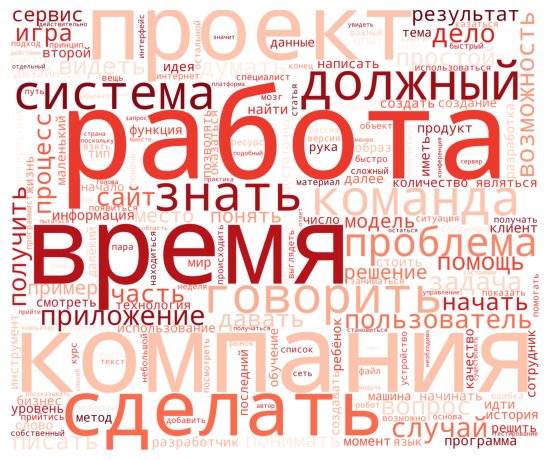

In [32]:
corpus = get_corpus(df['prep_text'].values)
                    
procWordCloud = get_wordCloud(corpus)

fig = plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(procWordCloud)
plt.axis('off')
plt.subplot(1, 2, 1)
plt.show()

##### Самые частые и крупные слова:
- человек
- работать
- время
- компания
- просто
- делать
- работа
- программа
- команда
- сделать
- использовать

##### Значит, текстах часто встречаются слова, связанные с деятельностью людей, командной работой, временем и компаниями.

In [33]:
# Получение облака слов
def get_wordCloud2(corpus):
    wordCloud = WordCloud(background_color='white',
                          stopwords=STOPWORDS,
                          colormap='twilight',
                          width=3000,
                          height=2500,
                          max_words=200,
                          random_state=111 ).generate(corpus)
    return wordCloud

### Популярные слова в рандомных статьях

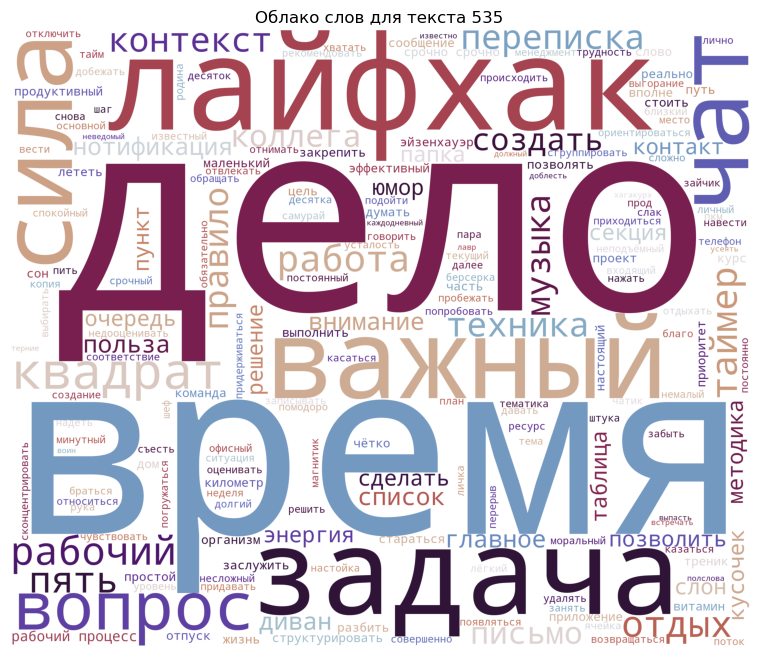

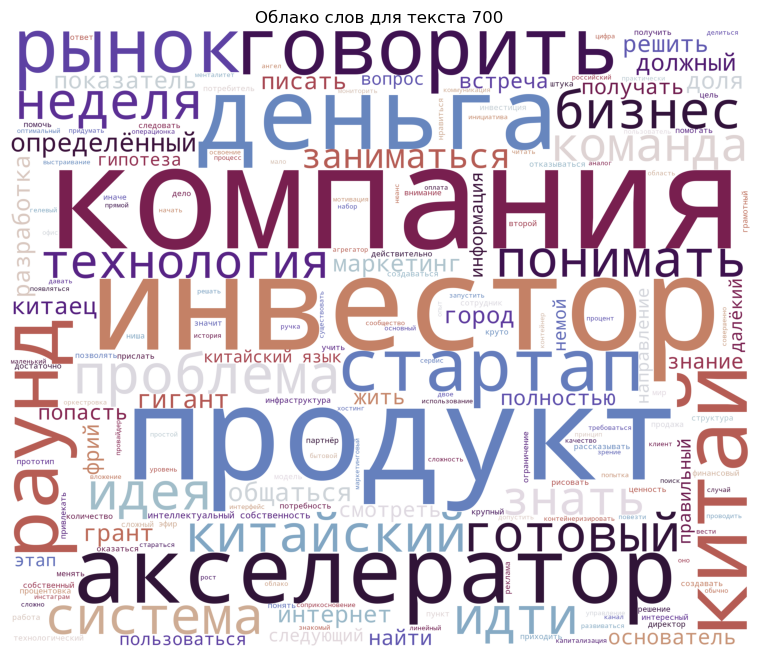

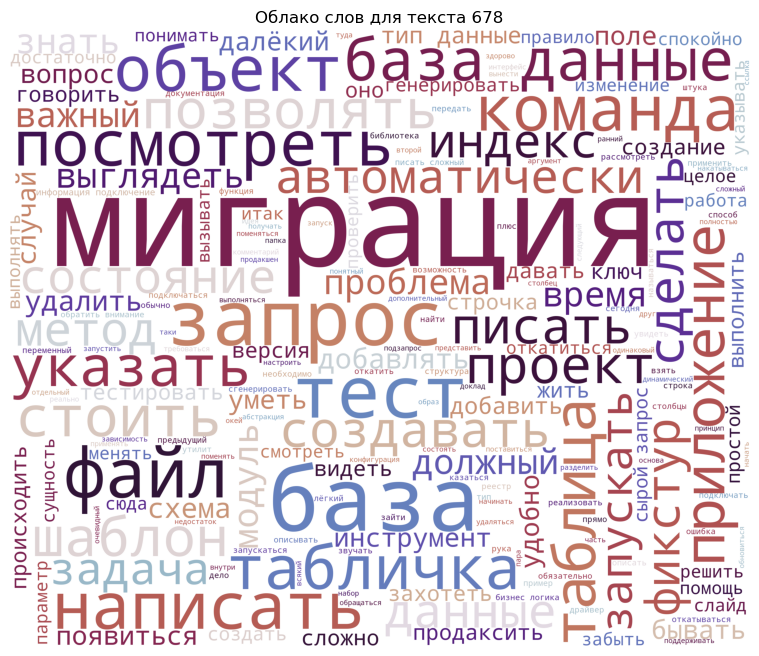

In [52]:
import random
random_indices = random.sample(range(1112), 3) # Выбираем 3 случайных индекса

for i in random_indices: 
    corpus = df['prep_text'][i] 
    procWordCloud = get_wordCloud2(corpus)
    fig = plt.figure(figsize=(15, 8))
    plt.imshow(procWordCloud)
    plt.axis('off')
    plt.title(f'Облако слов для текста {i}') 
    plt.show()
    plt.close(fig)

# Векторизация 

## TF - IDF

In [76]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [77]:
tfidf_vectorizer = TfidfVectorizer(min_df=5, 
                                   stop_words=ru_stopwords,
                                   ngram_range=(1, 3))

In [78]:
%%time
tfidf_matrix = tfidf_vectorizer.fit_transform(df['prep_text'])

CPU times: total: 5.03 s
Wall time: 5.04 s


In [38]:
len(tfidf_vectorizer.vocabulary_)

26016

In [39]:
tfidf_matrix.shape

(1111, 26016)

In [40]:
tfidf_vectorizer.get_feature_names_out()[:100]

array(['аббревиатура', 'абзац', 'абитуриент', 'абонент',
       'абстрагирование', 'абстрагировать', 'абстрагироваться',
       'абстрактный', 'абстракция', 'абсурд', 'абсурдный', 'аванс',
       'авантюра', 'аварийный', 'аварийный ситуация', 'авария', 'аватар',
       'аватарка', 'авиабилет', 'авиакомпания', 'авиационный', 'авиация',
       'австралийский', 'австралия', 'австрия', 'авто', 'автобус',
       'автобусный', 'автограф', 'автодополнение', 'автозаполнение',
       'автомат', 'автоматизатор', 'автоматизация',
       'автоматизация бизнес', 'автоматизация процесс',
       'автоматизация работа', 'автоматизация тестирование',
       'автоматизированный', 'автоматизированный система',
       'автоматизированный тестирование', 'автоматизировать',
       'автоматизировать процесс', 'автоматизировать рутинный',
       'автоматика', 'автоматически', 'автоматический',
       'автоматический режим', 'автоматический система',
       'автоматический тест', 'автоматический тестирование',

In [79]:
word_counts = tfidf_matrix.sum(axis=0).A1
top_indices = word_counts.argsort()[-200:][::-1]
top_words = tfidf_vectorizer.get_feature_names_out()[top_indices]

## Топ-слова

In [42]:
top_words

array(['работа', 'компания', 'приложение', 'время', 'проект', 'курс',
       'разработчик', 'команда', 'сайт', 'сервис', 'пользователь',
       'сделать', 'задача', 'проблема', 'система', 'студия', 'дизайн',
       'разработка', 'данные', 'язык', 'вопрос', 'решение', 'должный',
       'игра', 'продукт', 'обучение', 'онлайн', 'знать', 'процесс',
       'говорить', 'веб', 'бизнес', 'файл', 'случай', 'клиент',
       'возможность', 'получить', 'писать', 'функция', 'инструмент',
       'пример', 'информация', 'часть', 'модель', 'результат', 'опыт',
       'место', 'конференция', 'доклад', 'программа', 'помощь',
       'сотрудник', 'такси', 'рынок', 'дизайнер', 'идея', 'робот',
       'программист', 'технология', 'давать', 'дело', 'решить', 'статья',
       'мобильный', 'простой', 'создание', 'иметь', 'стоить',
       'специалист', 'рассказать', 'программирование', 'количество',
       'написать', 'версия', 'начать', 'момент', 'позволять', 'мир',
       'интернет', 'понять', 'тестирование',

# Тематическое моделирование

In [43]:
from gensim.models import LdaModel, CoherenceModel

In [44]:
en_stopwords = set(stopwords.words("english"))

In [45]:
def tokenize2(text):
    tokens = word_tokenize(text)
    tokens = [token for token in tokens if token.lower() not in ru_stopwords and token.lower() not in en_stopwords]
    return tokens


In [46]:
df['tokenize_text2'] = [tokenize2(text) for text in df['prep_text']]

## Подготовка данных

In [47]:
df['tokenize_text2'][5]

['автор',
 'повезти',
 'часть',
 'профессиональный',
 'команда',
 'применять',
 'практика',
 'поразить',
 'качество',
 'скорость',
 'разработка',
 'позитивный',
 'настрой',
 'команда',
 'коррелировать',
 'пайплайн',
 'мнение',
 'зрелость',
 'служить',
 'прекрасный',
 'показатель',
 'опытность',
 'разработчик',
 'качество',
 'эффективность',
 'команда',
 'многий',
 'случай',
 'наблюдать',
 'выстроить',
 'инженер',
 'отдельный',
 'команда',
 'последний',
 'отчёт',
 'продемонстрировать',
 'разработчик',
 'создавать',
 'цель',
 'увеличить',
 'число',
 'помочь',
 'разработчик',
 'взять',
 'ответственность',
 'выстраивать',
 'непрерывный',
 'процесс',
 'доставка',
 'создавать',
 'качественный',
 'статья',
 'рассматриваться',
 'фундаментальный',
 'концепция',
 'бизнес',
 'применять',
 'фреймворк',
 'позволять',
 'менять',
 'приоритет',
 'повышать',
 'скорость',
 'доставка',
 'прочее',
 'подход',
 'улучшать',
 'атмосфера',
 'команда',
 'помогать',
 'увеличить',
 'прибыль',
 'компания',
 'следо

In [60]:
gensim_dictionary = gensim.corpora.Dictionary(df['tokenize_text2'])
gensim_dictionary.filter_extremes(no_above=0.1, no_below=5)
gensim_dictionary.compactify()

# Cоздаем словарь для тематического моделирования
# Удаляем слишком частые слова и слишком редкие

In [61]:
corpus = [gensim_dictionary.doc2bow(text) for text in df['tokenize_text2']]

#преоразуем в числовой формат

In [50]:
corpus

[[(0, 1),
  (1, 1),
  (2, 1),
  (3, 2),
  (4, 1),
  (5, 1),
  (6, 1),
  (7, 2),
  (8, 5),
  (9, 1),
  (10, 1),
  (11, 4),
  (12, 1),
  (13, 1),
  (14, 1),
  (15, 1),
  (16, 1),
  (17, 2),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 11),
  (25, 1),
  (26, 1),
  (27, 4),
  (28, 2),
  (29, 1),
  (30, 1),
  (31, 1),
  (32, 1),
  (33, 2),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 1),
  (40, 2),
  (41, 1),
  (42, 1),
  (43, 1),
  (44, 1),
  (45, 1),
  (46, 4),
  (47, 2),
  (48, 1),
  (49, 1),
  (50, 1),
  (51, 2),
  (52, 2),
  (53, 1),
  (54, 1),
  (55, 2),
  (56, 2),
  (57, 2),
  (58, 1),
  (59, 1),
  (60, 1),
  (61, 3),
  (62, 1),
  (63, 5),
  (64, 2),
  (65, 2),
  (66, 5),
  (67, 1),
  (68, 5),
  (69, 2),
  (70, 1),
  (71, 1),
  (72, 1),
  (73, 1),
  (74, 1),
  (75, 1),
  (76, 1),
  (77, 1),
  (78, 3),
  (79, 1),
  (80, 1),
  (81, 1),
  (82, 1),
  (83, 1),
  (84, 1),
  (85, 2),
  (86, 1),
  (87, 4),
  (88, 1),
  (89, 2),
  (90, 1),
  (91, 1

## Подбор кол-ва тем (метод локтя)

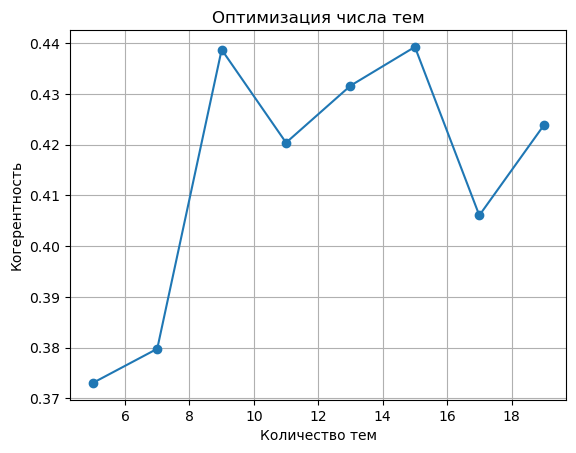

CPU times: total: 4min 6s
Wall time: 5min 42s


In [51]:
%%time
coherence_values = []
for num_topics in range(5, 15, 2):  # Перебираем разное количество тем
    lda_model = gensim.models.LdaMulticore(corpus=corpus,
                             num_topics=num_topics,
                             eta='auto',
                             id2word=gensim_dictionary,
                             passes=10,
                             random_state=111, workers=4)
    
    coherence_model = CoherenceModel(model=lda_model,
                                     texts=df["tokenize_text2"],
                                     dictionary=gensim_dictionary,
                                     coherence="c_v", processes=4)
    
    coherence_values.append(coherence_model.get_coherence())

# Построение графика
import matplotlib.pyplot as plt

plt.plot(range(5, 20, 2), coherence_values, marker='o')
plt.xlabel("Количество тем")
plt.ylabel("Когерентность")
plt.title("Оптимизация числа тем")
plt.grid(True)
plt.show()

notification.notify(
    title="Jupyter: Успех!",
    message="Лемматизация завершена.",
    timeout=10,
    app_icon=icon_path
)

Выявление лучшего кол-ва тем (11), поможет лучше обучить модель и показать лучшие метрики на данном наборе данных

## Обучение и метрика (Coherence)

In [62]:
lda_model = gensim.models.LdaModel(corpus, 
                                 num_topics=9,
                                 alpha='auto',
                                 eta='auto',
                                 id2word=gensim_dictionary, 
                                 passes=35, 
                                 iterations=400,
                                 random_state=111)

In [63]:
from gensim.models import CoherenceModel

coherence_model_lda = CoherenceModel(model=lda_model,
                                     texts=df["tokenize_text2"],
                                     dictionary=gensim_dictionary,
                                     coherence="c_v")
coherence_lda = coherence_model_lda.get_coherence()

print("\nCoherence Score: ", coherence_lda)


Coherence Score:  0.4254712431072842


## Слова для каждой темы

In [64]:
for topic in lda_model.print_topics():
    print(f'{topic} \n') 

(0, '0.004*"водитель" + 0.003*"агентство" + 0.003*"удалёнка" + 0.003*"робот" + 0.002*"ит" + 0.002*"предприятие" + 0.002*"пандемия" + 0.002*"фильм" + 0.002*"договор" + 0.002*"агрегатор"') 

(1, '0.022*"лицензия" + 0.006*"диск" + 0.005*"переменный" + 0.005*"массив" + 0.004*"анимация" + 0.004*"терминал" + 0.004*"скрипт" + 0.003*"символ" + 0.003*"сборка" + 0.003*"регистр"') 

(2, '0.009*"робот" + 0.006*"корпус" + 0.005*"камера" + 0.004*"датчик" + 0.003*"питание" + 0.003*"станция" + 0.003*"аккумулятор" + 0.003*"самолёт" + 0.003*"смартфон" + 0.003*"принтер"') 

(3, '0.004*"кандидат" + 0.003*"вакансия" + 0.003*"преподаватель" + 0.003*"спикер" + 0.003*"лекция" + 0.003*"резюме" + 0.003*"выступление" + 0.003*"тестировщик" + 0.003*"ит" + 0.003*"урок"') 

(4, '0.010*"маска" + 0.007*"пациент" + 0.006*"врач" + 0.006*"заболевание" + 0.006*"болезнь" + 0.005*"медицинский" + 0.005*"нейрон" + 0.005*"клетка" + 0.005*"вирус" + 0.004*"больной"') 

(5, '0.014*"шрифт" + 0.008*"компетенция" + 0.005*"распознава

## Визуализация и интерпретация LDA

In [65]:
# импорт необходимых библиотек
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis

In [66]:
from gensim.models import LdaModel
vis_9 = gensimvis.prepare(lda_model, corpus, gensim_dictionary)
pyLDAvis.display(vis_9) 

С помощью данных библиотек становится возможным:

    - увидеть распределение тем (размер кругов = их распространенность)
    - рассмотреть топ слова
    - близость тем др к др (чем дальше - тем уникальнее)

##### Темы 1, 3 расположены близко (похожий контент)
##### Темы 8 и 4 находятся далеко друг от друга (разные тематики)

# Обучение через scikit-learn

In [71]:
from sklearn.decomposition import NMF

In [ ]:
# создание модели NMF
nmf_model = NMF(n_components=9,
                  init='nndsvd',
                  solver='cd',
                  random_state=111,
                  l1_ratio=0.5)

In [80]:
nmf_model.fit(tfidf_matrix)

NMF(init='nndsvd', l1_ratio=0.5, n_components=9, random_state=111)

In [81]:
# Вывод топ слов для каждой темы
for i, topic in enumerate(nmf_model.components_):
    print(f"Topic {i}: {', '.join([tfidf_vectorizer.get_feature_names_out()[i] for i in topic.argsort()[-11:-1]])}")

Topic 0: проблема, думать, дело, сделать, рука, ребёнок, знать, говорить, работа, мозг
Topic 1: программирование, веб, мобильный, онлайн курс, практический, язык, программист, вебинар, приложение, курс
Topic 2: навык, знание, учиться, лекция, образование, тестирование, преподаватель, школа, студент, обучение
Topic 3: рынок, поездка, услуга, агрегатор, заказ, яндекс такси, водитель, компания, яндекс, сервис
Topic 4: иконка, интерфейс, пользователь, логотип, страница, шрифт, веб, дизайнер, студия, дизайн
Topic 5: задача, рассказать, бизнес, продукт, проект, сотрудник, работа, конференция, доклад, компания
Topic 6: пермь, искусственный интеллект, система, интеллект, искусственный, технология, компания, компания промобот, робототехника, промобот
Topic 7: движок, ребёнок, время, сюжет, герой, проект, играть, персонаж, игровой, игрок
Topic 8: сервис, модуль, команда, запрос, строка, сервер, пользователь, данные, функция, приложение


# Кластеризация

In [82]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

for k in [6, 7, 8, 9, 10, 11]:
    km = KMeans(n_clusters=k, random_state=111)
    labels = km.fit_predict(tfidf_matrix)
    print(f"k={k}: {silhouette_score(tfidf_matrix, labels):.3f}")  # Исправлена строка f-string

k=6: 0.009
k=7: 0.012
k=8: 0.013
k=9: 0.013
k=10: 0.011
k=11: 0.013


## Обучение KMeans

In [101]:
num_clusters = 11

km = KMeans(n_clusters=num_clusters)

In [102]:
%%time
km.fit(tfidf_matrix)

CPU times: total: 10.8 s
Wall time: 2.26 s


KMeans(n_clusters=11)

In [103]:
idx = km.fit(tfidf_matrix)
clusters = km.labels_.tolist()

In [104]:
clusterkm = km.labels_.tolist()
df['cluster']= clusterkm

## Распределение кластеров

In [105]:
df['cluster'].value_counts()

cluster
8     241
2     212
3     180
5      90
6      82
7      75
4      57
0      53
9      52
1      50
10     19
Name: count, dtype: int64

##### Данные получились дисбалансированными, сравнивая 13 и 0 кластер

## Облака слов и определение тем

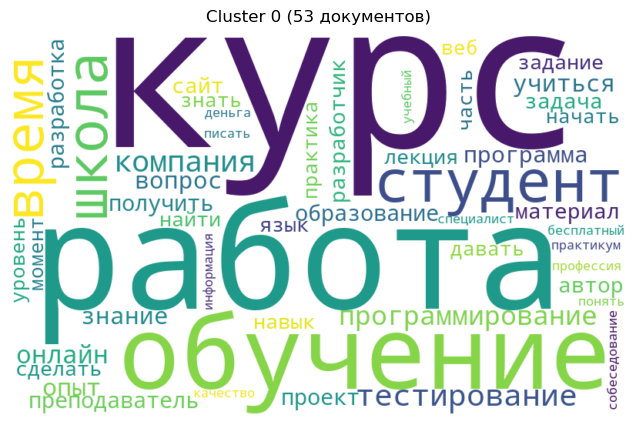

In [106]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

cluster_num = 0

cluster_docs = df[df['cluster'] == cluster_num]['tokenize_text2']

# Объед тексты кластера в одну строку
text = " ".join(doc if isinstance(doc, str) else " ".join(doc) 
               for doc in cluster_docs)

# Создаем облако слов
wordcloud = WordCloud(
    width=800,
    height=500,
    background_color='white',
    collocations=False,  # Для учета словосочет
    max_words=50         # Огранич числа слов
).generate(text)

# Вывод
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title(f"Cluster {cluster_num} ({len(cluster_docs)} документов)")
plt.axis("off")
plt.show()

### Cluster 0. Образование и обучение, курсы по программированию 
    Встречающиеся слова: «курс», «обучение», «студент», «школа», «преподаватель». Также встречаются слова, связанные с программированием и тестированием, что говорит о техническом образовании.

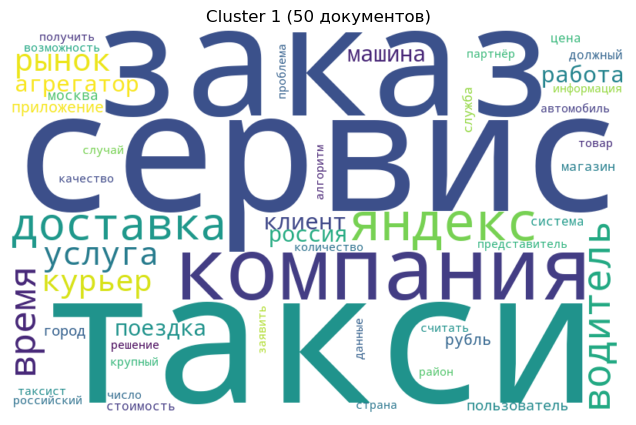

In [107]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

cluster_num = 1

cluster_docs = df[df['cluster'] == cluster_num]['tokenize_text2']

# Объед тексты кластера в одну строку
text = " ".join(doc if isinstance(doc, str) else " ".join(doc) 
               for doc in cluster_docs)

# Создаем облако слов
wordcloud = WordCloud(
    width=800,
    height=500,
    background_color='white',
    collocations=False,  # Для учета словосочет
    max_words=50         # Огранич числа слов
).generate(text)

# Вывод
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title(f"Cluster {cluster_num} ({len(cluster_docs)} документов)")
plt.axis("off")
plt.show()

### Cluster 1. Сервисы такси и доставка 
    Доминирование слов «заказ», «такси», «сервис», «водитель», «доставка», «агрегатор», «Яндекс», «клиент», «поездка». Явное указание на связь с сервисами такси и курьерской доставкой, обсуждение работы агрегаторов, взаимодействия с клиентами и водителями.

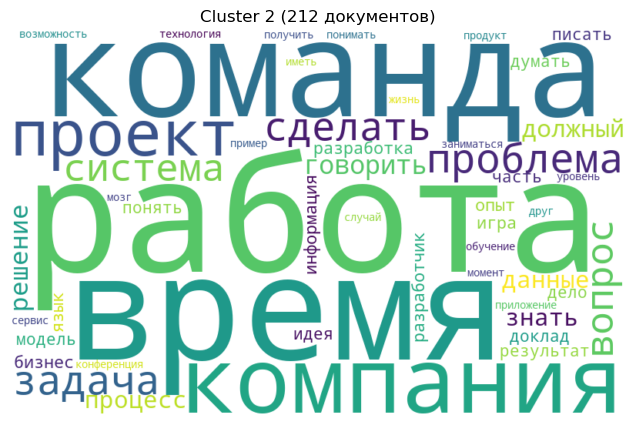

In [108]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

cluster_num = 2

cluster_docs = df[df['cluster'] == cluster_num]['tokenize_text2']

# Объед тексты кластера в одну строку
text = " ".join(doc if isinstance(doc, str) else " ".join(doc) 
               for doc in cluster_docs)

# Создаем облако слов
wordcloud = WordCloud(
    width=800,
    height=500,
    background_color='white',
    collocations=False,  # Для учета словосочет
    max_words=50         # Огранич числа слов
).generate(text)

# Вывод
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title(f"Cluster {cluster_num} ({len(cluster_docs)} документов)")
plt.axis("off")
plt.show()

### Cluster 2: Рабочий процесс в команде и управление проектами
    Слова, связаны с командной работой, проектами и решением проблем. Это указывает на обсуждение взаимодействия в рабочих группах, управления проектами и бизнес-процессов.

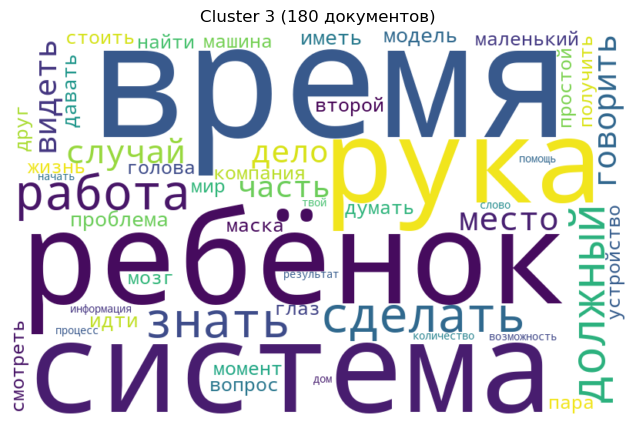

In [109]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

cluster_num = 3

cluster_docs = df[df['cluster'] == cluster_num]['tokenize_text2']

# Объед тексты кластера в одну строку
text = " ".join(doc if isinstance(doc, str) else " ".join(doc) 
               for doc in cluster_docs)

# Создаем облако слов
wordcloud = WordCloud(
    width=800,
    height=500,
    background_color='white',
    collocations=False,  # Для учета словосочет
    max_words=50         # Огранич числа слов
).generate(text)

# Вывод
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title(f"Cluster {cluster_num} ({len(cluster_docs)} документов)")
plt.axis("off")
plt.show()

### Cluster 3: Образование и развитие детей, возможно, с техническим уклоном
    Слова «ребенок», «рука», «маска», «модель» могут указывать на темы, связанные с развитием, обучением детей, а также возможно использование технических средств (например, модели, системы) в этом процессе.

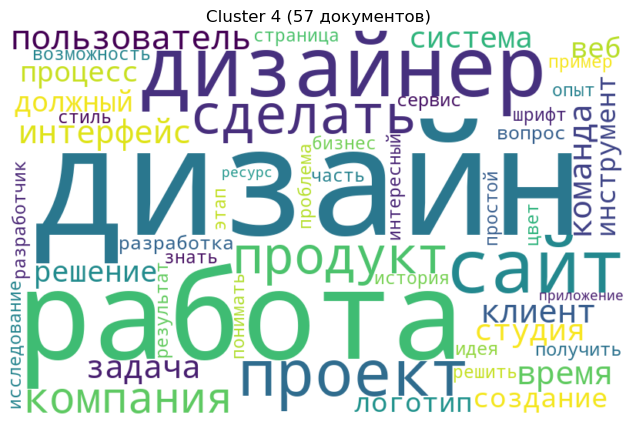

In [110]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

cluster_num = 4

cluster_docs = df[df['cluster'] == cluster_num]['tokenize_text2']

# Объед тексты кластера в одну строку
text = " ".join(doc if isinstance(doc, str) else " ".join(doc) 
               for doc in cluster_docs)

# Создаем облако слов
wordcloud = WordCloud(
    width=800,
    height=500,
    background_color='white',
    collocations=False,  # Для учета словосочет
    max_words=50         # Огранич числа слов
).generate(text)

# Вывод
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title(f"Cluster {cluster_num} ({len(cluster_docs)} документов)")
plt.axis("off")
plt.show()

### Cluster 4:  Дизайн продуктов и пользовательских интерфейсов
    Явно выделяются слова, связанные с дизайном: «дизайн», «дизайнер», «интерфейс», «продукт», «логотип», что говорит о теме, связанной с визуальной и UX-разработкой продуктов, сайтов и приложений.

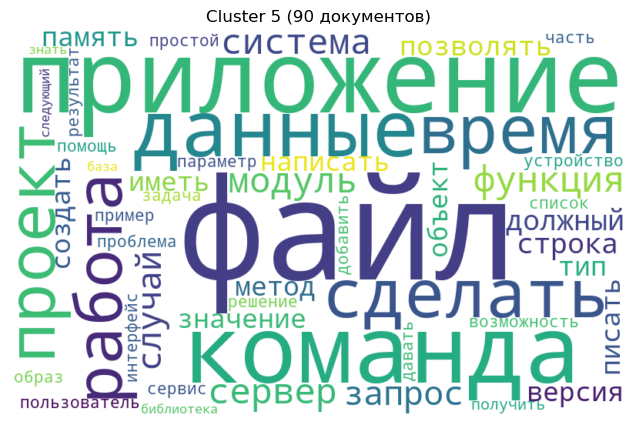

In [111]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

cluster_num = 5

cluster_docs = df[df['cluster'] == cluster_num]['tokenize_text2']

# Объед тексты кластера в одну строку
text = " ".join(doc if isinstance(doc, str) else " ".join(doc) 
               for doc in cluster_docs)

# Создаем облако слов
wordcloud = WordCloud(
    width=800,
    height=500,
    background_color='white',
    collocations=False,  # Для учета словосочет
    max_words=50         # Огранич числа слов
).generate(text)

# Вывод
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title(f"Cluster {cluster_num} ({len(cluster_docs)} документов)")
plt.axis("off")
plt.show()

### Cluster 5: Лицензирование и разработка программного обеспечения, работа с данными 
    Слова «файл», «приложение», «сервер», «модуль», «функция», «запрос» однозначно связаны с программированием, разработкой ПО, обработкой данных и взаимодействием компонентов.

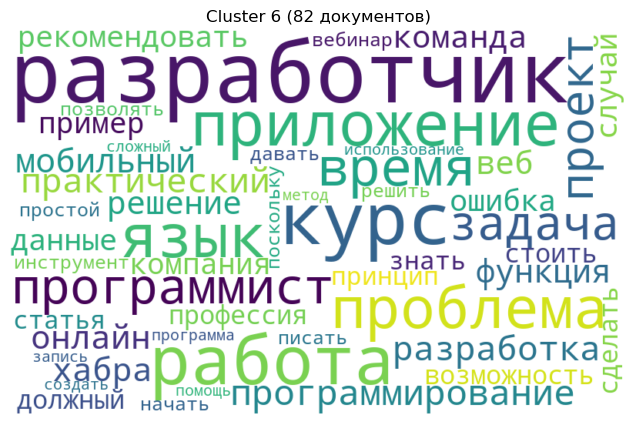

In [112]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

cluster_num = 6

cluster_docs = df[df['cluster'] == cluster_num]['tokenize_text2']

# Объед тексты кластера в одну строку
text = " ".join(doc if isinstance(doc, str) else " ".join(doc) 
               for doc in cluster_docs)

# Создаем облако слов
wordcloud = WordCloud(
    width=800,
    height=500,
    background_color='white',
    collocations=False,  # Для учета словосочет
    max_words=50         # Огранич числа слов
).generate(text)

# Вывод
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title(f"Cluster {cluster_num} ({len(cluster_docs)} документов)")
plt.axis("off")
plt.show()

### Cluster 6: Практическое программирование и обучение разработке мобильных приложений 
    Много слов, связанных с профессией разработчика и программированием («разработчик», «программист», «язык»), а также «приложение» и «мобильный» указывают на мобильную разработку. Слово «курс» и «практический» говорят об обучении с практикой.

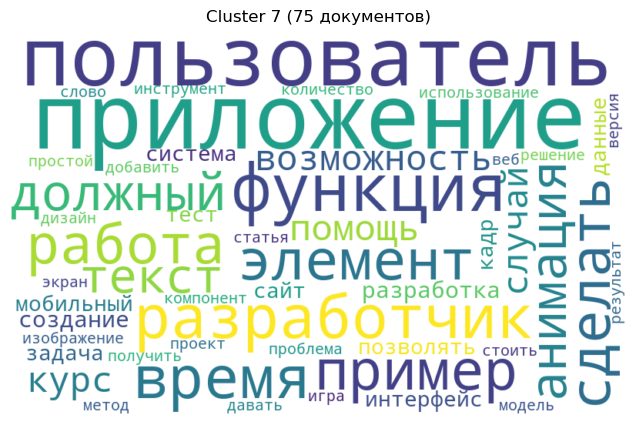

In [113]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

cluster_num = 7

cluster_docs = df[df['cluster'] == cluster_num]['tokenize_text2']

# Объед тексты кластера в одну строку
text = " ".join(doc if isinstance(doc, str) else " ".join(doc) 
               for doc in cluster_docs)

# Создаем облако слов
wordcloud = WordCloud(
    width=800,
    height=500,
    background_color='white',
    collocations=False,  # Для учета словосочет
    max_words=50         # Огранич числа слов
).generate(text)

# Вывод
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title(f"Cluster {cluster_num} ({len(cluster_docs)} документов)")
plt.axis("off")
plt.show()

### Cluster 7: Разработка пользовательских интерфейсов и UX-дизайн приложений 
    Ключевые слова связаны с элементами интерфейса и пользовательским опытом: «пользователь», «элемент», «функция», «анимация», «интерфейс». Также упоминается «разработчик», что указывает на процесс создания UI.

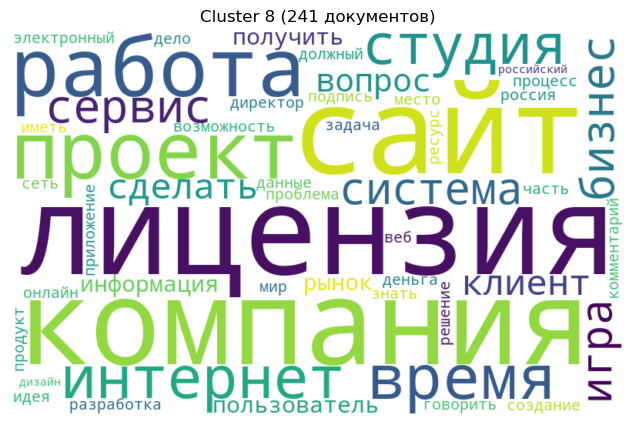

In [114]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

cluster_num = 8

cluster_docs = df[df['cluster'] == cluster_num]['tokenize_text2']

# Объед тексты кластера в одну строку
text = " ".join(doc if isinstance(doc, str) else " ".join(doc) 
               for doc in cluster_docs)

# Создаем облако слов
wordcloud = WordCloud(
    width=800,
    height=500,
    background_color='white',
    collocations=False,  # Для учета словосочет
    max_words=50         # Огранич числа слов
).generate(text)

# Вывод
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title(f"Cluster {cluster_num} ({len(cluster_docs)} документов)")
plt.axis("off")
plt.show()

### Cluster 8: Бизнес и юридические аспекты онлайн-проектов и компаний  
    Ключевые слова — «лицензия», «компания», «бизнес», «сервис» и «интернет» говорит о правовой и коммерческой стороне ведения интернет-проектов, сайтов, студий.

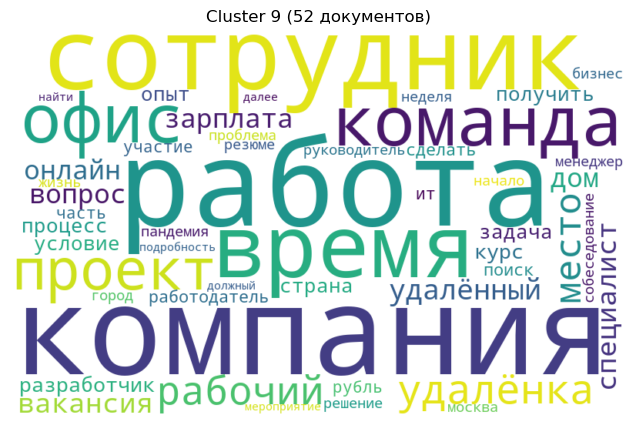

In [115]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

cluster_num = 9

cluster_docs = df[df['cluster'] == cluster_num]['tokenize_text2']

# Объед тексты кластера в одну строку
text = " ".join(doc if isinstance(doc, str) else " ".join(doc) 
               for doc in cluster_docs)

# Создаем облако слов
wordcloud = WordCloud(
    width=800,
    height=500,
    background_color='white',
    collocations=False,  # Для учета словосочет
    max_words=50         # Огранич числа слов
).generate(text)

# Вывод
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title(f"Cluster {cluster_num} ({len(cluster_docs)} документов)")
plt.axis("off")
plt.show()

### Cluster 9: Работа и условия труда, удалённая работа, кадровые вопросы 
    Встречаются слова, связанные с работой в компании, сотрудниками, условиями труда и удалёнкой — «удалёнка», «вакансия», «зарплата», «пандемия». Это явно тема HR и трудовых отношений.

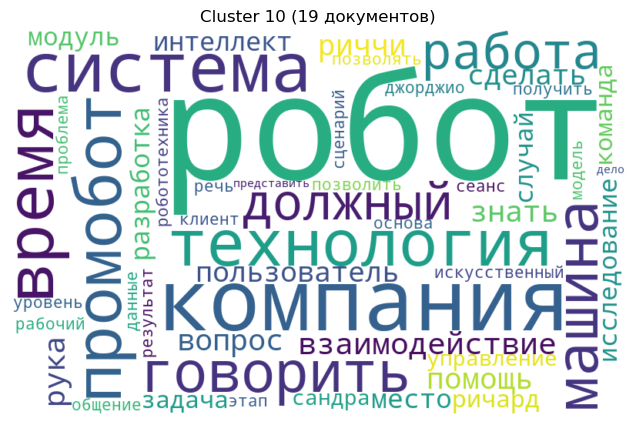

In [116]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

cluster_num = 10

cluster_docs = df[df['cluster'] == cluster_num]['tokenize_text2']

# Объед тексты кластера в одну строку
text = " ".join(doc if isinstance(doc, str) else " ".join(doc) 
               for doc in cluster_docs)

# Создаем облако слов
wordcloud = WordCloud(
    width=800,
    height=500,
    background_color='white',
    collocations=False,  # Для учета словосочет
    max_words=50         # Огранич числа слов
).generate(text)

# Вывод
plt.figure(figsize=(8, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title(f"Cluster {cluster_num} ({len(cluster_docs)} документов)")
plt.axis("off")
plt.show()

### Cluster 10:  Робототехника и технологии искусственного интеллекта 
    Слова «робот», «машина», «искусственный интеллект», «технология» указывают на темы, связанные с робототехникой, AI и современными технологиями. Также «взаимодействие» и «модуль» говорят об инженерных аспектах.

#####

In [117]:
# Допустим, у тебя есть DataFrame df с колонкой 'cluster'
# Создаем словарь с названиями кластеров
cluster_names = {
    0: 'Образование и обучение, курсы по программированию. Встречающиеся слова: «курс», «обучение», «студент», «школа», «преподаватель». Также встречаются слова, связанные с программированием и тестированием, что говорит о техническом образовании.',
    1: 'Сервисы такси и доставка. Доминирование слов «заказ», «такси», «сервис», «водитель», «доставка», «агрегатор», «Яндекс», «клиент», «поездка». Явное указание на связь с сервисами такси и курьерской доставкой, обсуждение работы агрегаторов, взаимодействия с клиентами и водителями.',
    2: 'Рабочий процесс в команде и управление проектами. Слова, связаны с командной работой, проектами и решением проблем. Это указывает на обсуждение взаимодействия в рабочих группах, управления проектами и бизнес-процессов.',
    3: 'Образование и развитие детей, возможно, с техническим уклоном. Слова «ребенок», «рука», «маска», «модель» могут указывать на темы, связанные с развитием, обучением детей, а также возможно использование технических средств (например, модели, системы) в этом процессе.',
    4: 'Дизайн продуктов и пользовательских интерфейсов. Явно выделяются слова, связанные с дизайном: «дизайн», «дизайнер», «интерфейс», «продукт», «логотип», что говорит о теме, связанной с визуальной и UX-разработкой продуктов, сайтов и приложений.',
    5: 'Лицензирование и разработка программного обеспечения, работа с данными. Слова «файл», «приложение», «сервер», «модуль», «функция», «запрос» однозначно связаны с программированием, разработкой ПО, обработкой данных и взаимодействием компонентов.',
    6: 'Практическое программирование и обучение разработке мобильных приложений. Много слов, связанных с профессией разработчика и программированием («разработчик», «программист», «язык»), а также «приложение» и «мобильный» указывают на мобильную разработку. Слово «курс» и «практический» говорят об обучении с практикой.',
    7: 'Разработка пользовательских интерфейсов и UX-дизайн приложений. Ключевые слова связаны с элементами интерфейса и пользовательским опытом: «пользователь», «элемент», «функция», «анимация», «интерфейс». Также упоминается «разработчик», что указывает на процесс создания UI.',
    8: 'Бизнес и юридические аспекты онлайн-проектов и компаний. Ключевые слова — «лицензия», «компания», «бизнес», «сервис» и «интернет» говорит о правовой и коммерческой стороне ведения интернет-проектов, сайтов, студий.',
    9: 'Работа и условия труда, удалённая работа, кадровые вопросы. Встречаются слова, связанные с работой в компании, сотрудниками, условиями труда и удалёнкой — «удалёнка», «вакансия», «зарплата», «пандемия». Это явно тема HR и трудовых отношений.',
    10: 'Робототехника и технологии искусственного интеллекта. Слова «робот», «машина», «искусственный интеллект», «технология» указывают на темы, связанные с робототехникой, AI и современными технологиями. Также «взаимодействие» и «модуль» говорят об инженерных аспектах.'
}

# Добавляем новую колонку с названиями кластеров
df['cluster_name'] = df['cluster'].map(cluster_names)

# Проверяем результат
print(df[['cluster', 'cluster_name']].head())

   cluster                                       cluster_name
0        5  Лицензирование и разработка программного обесп...
1        8  Бизнес и юридические аспекты онлайн-проектов и...
2        5  Лицензирование и разработка программного обесп...
3        4  Дизайн продуктов и пользовательских интерфейсо...
4       10  Робототехника и технологии искусственного инте...


# Итоги кластеризации: 
    Cluster 0. Образование и обучение, курсы по программированию 
    Встречающиеся слова: «курс», «обучение», «студент», «школа», «преподаватель». Также встречаются слова, связанные с программированием и тестированием, что говорит о техническом образовании.


    Cluster 1. Сервисы такси и доставка
    Доминирование слов «заказ», «такси», «сервис», «водитель», «доставка», «агрегатор», «Яндекс», «клиент», «поездка». Явное указание на связь с сервисами такси и курьерской доставкой, обсуждение работы агрегаторов, взаимодействия с клиентами и водителями.


    Cluster 2: Рабочий процесс в команде и управление проектами
    Слова, связаны с командной работой, проектами и решением проблем. Это указывает на обсуждение взаимодействия в рабочих группах, управления проектами и бизнес-процессов.


    Cluster 3: Образование и развитие детей, возможно, с техническим уклоном
    Слова «ребенок», «рука», «маска», «модель» могут указывать на темы, связанные с развитием, обучением детей, а также возможно использование технических средств (например, модели, системы) в этом процессе.


    Cluster 4:  Дизайн продуктов и пользовательских интерфейсов
    Явно выделяются слова, связанные с дизайном: «дизайн», «дизайнер», «интерфейс», «продукт», «логотип», что говорит о теме, связанной с визуальной и UX-разработкой продуктов, сайтов и приложений.

    Cluster 5: Лицензирование и разработка программного обеспечения, работа с данными 
    Слова «файл», «приложение», «сервер», «модуль», «функция», «запрос» однозначно связаны с программированием, разработкой ПО, обработкой данных и взаимодействием компонентов.


    Cluster 6: Практическое программирование и обучение разработке мобильных приложений 
    Много слов, связанных с профессией разработчика и программированием («разработчик», «программист», «язык»), а также «приложение» и «мобильный» указывают на мобильную разработку. Слово «курс» и «практический» говорят об обучении с практикой.

    Cluster 7: Разработка пользовательских интерфейсов и UX-дизайн приложений 
    Ключевые слова связаны с элементами интерфейса и пользовательским опытом: «пользователь», «элемент», «функция», «анимация», «интерфейс». Также упоминается «разработчик», что указывает на процесс создания UI.

    Cluster 8: Бизнес и юридические аспекты онлайн-проектов и компаний  
    Ключевые слова — «лицензия», «компания», «бизнес», «сервис» и «интернет» говорит о правовой и коммерческой стороне ведения интернет-проектов, сайтов, студий.

    Cluster 9: Работа и условия труда, удалённая работа, кадровые вопросы 
    Встречаются слова, связанные с работой в компании, сотрудниками, условиями труда и удалёнкой — «удалёнка», «вакансия», «зарплата», «пандемия». Это явно тема HR и трудовых отношений.

    Cluster 10:  Робототехника и технологии искусственного интеллекта 
    Слова «робот», «машина», «искусственный интеллект», «технология» указывают на темы, связанные с робототехникой, AI и современными технологиями. Также «взаимодействие» и «модуль» говорят об инженерных аспектах.
    
    

##### Темы получились разнообразные

##### Можно перейти к классификации данных

##### 

##### 

# Классификация данных

In [124]:
from sklearn.metrics import accuracy_score, mean_absolute_error, mean_squared_error, precision_score, recall_score, f1_score, confusion_matrix, r2_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [125]:
df

,Unnamed: 0,NameCompany,Description,TextArticle,prep_text,tokenize_text2,cluster,cluster_name
0,0,red_mad_robot,№1 в разработке цифровых решений для бизнеса,Старший iOS разработчик red_mad_robot Аня Коче...,старший разработчик рассказывать отличаться ме...,"[старший, разработчик, рассказывать, отличатьс...",5,Лицензирование и разработка программного обесп...
1,1,,,Зарплаты айтишников Найдено весенние мероприя...,зарплата айтишник найти весенний мероприятие а...,"[зарплата, айтишник, найти, весенний, мероприя...",8,Бизнес и юридические аспекты онлайн-проектов и...
2,2,Cloud4Y,#1 Корпоративный облачный провайдер,Чтобы начать попытки заполучить доступ к аккау...,начать попытка заполучить доступ аккаунт должн...,"[начать, попытка, заполучить, доступ, аккаунт,...",5,Лицензирование и разработка программного обесп...
3,3,Selectel,IT инфраструктура для бизнеса,"Зарплаты айтишников Травка зеленеет, солнышко ...",зарплата айтишник травка зеленеть солнышко бле...,"[зарплата, айтишник, травка, зеленеть, солнышк...",4,Дизайн продуктов и пользовательских интерфейсо...
4,4,RUVDS com,VDS/VPS хостинг Скидка 15% по коду HABR15,Зарплаты айтишников Найдено весенние мероприя...,зарплата айтишник найти весенний мероприятие а...,"[зарплата, айтишник, найти, весенний, мероприя...",10,Робототехника и технологии искусственного инте...
...,...,...,...,...,...,...,...,...
1106,1106,Федерация креативных индустрий,,"Как менеджер, вы должны заботиться о ваших сот...",менеджер должный заботиться сотрудник поддержи...,"[менеджер, должный, заботиться, сотрудник, под...",2,Рабочий процесс в команде и управление проекта...
1107,1107,Федерация креативных индустрий,,"Привет, Хабр! Представляю вашему вниманию пере...",хабра представлять внимание перевод статья ...,"[хабра, представлять, внимание, перевод, стать...",2,Рабочий процесс в команде и управление проекта...
1108,1108,Федерация креативных индустрий,,Источник «Умный человек не делает все ошибки с...,источник умный ошибка давать шанс уинстон черч...,"[источник, умный, ошибка, давать, шанс, уинсто...",8,Бизнес и юридические аспекты онлайн-проектов и...
1109,1109,Федерация креативных индустрий,,"Привет! Меня зовут Никита Бокарев, я креативны...",звать никита бокарев креативный продюсер игров...,"[звать, никита, бокарев, креативный, продюсер,...",8,Бизнес и юридические аспекты онлайн-проектов и...


In [126]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df['prep_text'], 
                                                    df['cluster'], 
                                                    test_size=0.3, 
                                                    random_state=111, 
                                                    stratify=df['cluster'])

In [127]:
#проверим распределение классов
print(pd.Series(y_train).value_counts(normalize=True))

cluster
8     0.217503
2     0.190476
3     0.162162
5     0.081081
6     0.073359
7     0.068211
4     0.051480
0     0.047619
9     0.046332
1     0.045045
10    0.016731
Name: proportion, dtype: float64


In [128]:
len(X_train)

777

In [129]:
len(X_test)

334

In [130]:
from sklearn.metrics import accuracy_score

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

In [131]:
vectorizer = TfidfVectorizer(max_features=10000, ngram_range=(1,3), stop_words=ru_stopwords)
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)

## LogisticRegression

In [132]:
model_lr = LogisticRegression()
model_lr.fit(X_train_tfidf, y_train)

LogisticRegression()

In [133]:
y_pred = model_lr.predict(X_test_tfidf)

In [134]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.38      0.55        16
           1       1.00      0.67      0.80        15
           2       0.70      0.97      0.81        64
           3       0.89      0.87      0.88        54
           4       1.00      0.47      0.64        17
           5       0.90      0.70      0.79        27
           6       0.86      0.76      0.81        25
           7       0.92      0.55      0.69        22
           8       0.69      0.94      0.80        72
           9       1.00      0.62      0.77        16
          10       1.00      0.67      0.80         6

    accuracy                           0.79       334
   macro avg       0.91      0.69      0.76       334
weighted avg       0.83      0.79      0.79       334



In [135]:
y_pred

array([ 2,  8,  2,  4,  3,  6,  8,  2,  2,  2,  8,  8,  9,  8,  5,  8,  5,
        2,  8,  6,  8,  3, 10,  6,  8,  8,  7,  3,  8,  2,  3,  2,  2,  2,
        8,  8,  2,  3,  3,  8,  8,  8,  8,  8,  3,  2,  8,  8,  3,  5,  0,
        3,  2,  2,  2,  8,  9,  6,  2,  3,  8,  8,  2,  3,  2,  2,  8,  8,
        2,  8,  2,  3,  3,  3,  8,  3, 10,  8,  2,  1,  2,  8,  7,  9,  2,
        8,  8,  2,  2,  8,  5,  2,  9,  8,  3,  3,  2,  2,  6,  3,  2,  2,
        8,  9,  7,  3,  2,  7,  2,  3,  8,  6,  1,  8,  8,  2,  7,  8,  8,
        8,  5,  8,  6,  5,  4,  1,  8,  6,  9,  8,  2,  8,  3,  3,  2,  5,
        2,  8,  8,  3,  2,  2,  6,  8,  8,  2,  8,  5,  8,  5,  2,  2,  8,
        8,  2,  8,  2,  0,  8,  6,  2,  3,  2,  2,  8,  2,  2,  5,  0,  8,
        7,  8,  8,  6,  5,  9,  3,  3,  5,  5,  2,  3,  6,  5,  2, 10,  8,
        2,  2,  8,  2,  8,  3,  2,  3,  6,  8,  2,  3,  2,  3,  6,  2,  1,
        8,  8,  8,  2,  8,  8,  3,  2,  8,  8,  2,  2,  8,  3,  8,  3,  1,
        3,  2,  2,  6,  7

## RandomForestClassifier

In [136]:
model_rf = RandomForestClassifier()
model_rf.fit(X_train_tfidf, y_train)

RandomForestClassifier()

In [137]:
y_pred = model_rf.predict(X_test_tfidf)

In [138]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.12      0.22        16
           1       1.00      0.60      0.75        15
           2       0.50      0.89      0.64        64
           3       0.72      0.67      0.69        54
           4       1.00      0.18      0.30        17
           5       0.86      0.22      0.35        27
           6       0.64      0.84      0.72        25
           7       0.33      0.05      0.08        22
           8       0.55      0.86      0.67        72
           9       1.00      0.12      0.22        16
          10       0.00      0.00      0.00         6

    accuracy                           0.60       334
   macro avg       0.69      0.41      0.42       334
weighted avg       0.66      0.60      0.54       334



##### По сравнению с прошлой моделью RandomForestClassifier показал результаты хуже. 


In [139]:
model_knn = KNeighborsClassifier()
model_knn.fit(X_train_tfidf, y_train)

KNeighborsClassifier()

In [140]:
y_pred = model_knn.predict(X_test_tfidf)

In [141]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.58      0.88      0.70        16
           1       0.93      0.93      0.93        15
           2       0.68      0.75      0.71        64
           3       0.84      0.80      0.82        54
           4       0.59      0.76      0.67        17
           5       0.68      0.78      0.72        27
           6       0.95      0.76      0.84        25
           7       0.85      0.50      0.63        22
           8       0.74      0.62      0.68        72
           9       0.79      0.94      0.86        16
          10       0.86      1.00      0.92         6

    accuracy                           0.75       334
   macro avg       0.77      0.79      0.77       334
weighted avg       0.76      0.75      0.74       334



##### По сравнению с прошлыми 2 моделями, показал не лучшие результаты KNeighborsClassifier.

# Вывод об классификации

##### Разница между macro avg и weighted avg в метриках у моделей говорит о том, что распределение классов более-менее сбалансировано.

##### Модели предсказали относительно хорошие результаты для данных кластеров, но есть недочеты в определенных классах, которые возможно присутствуют из-за недостаточных данных и довольно небольшого по размеру загруженного датасета.

# Сохранение моделей

In [142]:
import pickle

In [143]:
with open('model_logistik_habr.pkl', 'wb') as f:
    pickle.dump(model_lr, f)

In [144]:
with open('tfidf_vectorizer_habr.pkl', 'wb') as f:
    pickle.dump(tfidf_vectorizer, f)